# История развития свёрточных нейронных сетей

## 1989 год

Ян Лекун создаёт первую архитектуру, оригинальная статья: http://yann.lecun.com/exdb/publis/pdf/lecun-89e.pdf

В ней используются:
* свёртки;
* метод обратного распространения ошибки.

<img src = 'https://karpathy.github.io/assets/lecun/lecun1989.png' width = '1000'>

Пример реализации: https://github.com/karpathy/lecun1989-repro/tree/master

## 1998

Группа, возглавляемая Яном Лекуном, создаёт сеть LeNet-5. Оригинальная статья: http://vision.stanford.edu/cs598_spring07/papers/Lecun98.pdf


Нововведения:
- появилось два слоя пулинга;
- постобработка на выходе.

<img src = 'https://github.com/jmlee8939/LeNet-5_1998_pytorch/blob/main/fig/structure.PNG?raw=true'>

Пример реализации: https://github.com/amir-saniyan/LeNet-5/tree/master

## 2012


Alex Krizhevsky и команда создают сеть AlexNet и выигрывает соревнования ImageNet с большим отрывом.

Оригинальная статья: https://proceedings.neurips.cc/paper_files/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf


Нестандартные решения, принятые разработчиками **AlexNet**:
* Использование **ReLU** в качестве функции активации. Предшественники использовали ограниченные функции, типа сигмоиды или тангенса, которые приводили к затуханию градиента.
* Использование авторской **нормализации** Local Response Normalization. Позже было показано, что их нормализация не давала значительного прироста скорости обучения и качества модели. В современных моделях чаще используется Batch-нормализация.
* Использование различных **методов предобработки** входных данных (аугментация), таких как повороты, увеличение, зашумление и т.д. для увеличения разнообразия входных данных.
* Использование **Dropout** = 0.5 (при обучении отключается случайная половина нейронов).
* Использование **SGD Momentum** = 0.9. Для обеспечения сходимости авторы использовали эвристику для **понижения скорости обучения** (learning rate)
* **Скорость обучения** стартует со значения $10^{-2}$ и уменьшается в 10 раз, когда качество перестает расти.
* **L2 регуляризация** с весом $5 \cdot 10^{-4}$.
* Использование **ансамбля** из 7 обученных из различного начального состояния моделей. Результат работы моделей усредняется. Данное решение увеличило точность с 81.8% до 84.6%.


<img src = 'https://wikidocs.net/images/page/164787/AlexNet-Fig_03.png'>

In [ ]:
import torch
model = torch.hub.load('pytorch/vision:v0.13.0', 'alexnet', pretrained=True)
model.eval()

Downloading: "https://github.com/pytorch/vision/zipball/v0.13.0" to /root/.cache/torch/hub/v0.13.0.zip
/root/.cache/torch/hub/pytorch_vision_v0.13.0/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 
  warn(f"Failed to load image Python extension: {e}")
/root/.cache/torch/hub/pytorch_vision_v0.13.0/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/root/.cache/torch/hub/pytorch_vision_v0.13.0/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/t

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Для всех натренированных моделей ожидаются изображения после следующих трансформаций:
3-канальные RGB изображения размерность `(3 x H x W)`, где `H` и `W` как минимум `224`.
Изображения должны быть приведены к диапазону `[0, 1]` при помощи нормализации с параметрами `mean = [0.485, 0.456, 0.406]`и `std = [0.229, 0.224, 0.225]`.

In [ ]:
import urllib
url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")
try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

In [ ]:
from PIL import Image
from torchvision import transforms
input_image = Image.open(filename)
preprocess = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

device = torch.device('cpu')
model.to(device)
input_batch.to(device)

probabilities = torch.nn.functional.softmax(model(input_batch)[0], dim=0)

In [ ]:
# Download ImageNet labels
!wget https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt

--2023-11-15 14:17:13--  https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10472 (10K) [text/plain]
Saving to: ‘imagenet_classes.txt’

imagenet_classes.tx 100%[===================>]  10.23K  --.-KB/s    in 0s      

2023-11-15 14:17:14 (98.6 MB/s) - ‘imagenet_classes.txt’ saved [10472/10472]



In [ ]:
# Read the categories
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]
# Show top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())

wallaby 0.9133386611938477
Angora 0.02884550578892231
Samoyed 0.027153464034199715
Persian cat 0.00962077733129263
Pomeranian 0.006952814757823944


**Задание. Нарисовать граф сети AlexNet.**

In [ ]:
pip install alexnet_pytorch

In [ ]:
pip install torchviz

  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4133 sha256=9c171226cacde16d3254a565a1b904f6af6898f6cab3c9f5bca224df7b522e67
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torchviz


In [ ]:
from torchviz import make_dot
from alexnet_pytorch import AlexNet
model = AlexNet.from_pretrained('alexnet', num_classes=10)

x = torch.randn(1, 3, 227, 227).requires_grad_(True)
y = model(x)

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-4df8aa71.pth
100%|██████████| 233M/233M [00:09<00:00, 26.5MB/s]


Loaded pretrained weights for alexnet


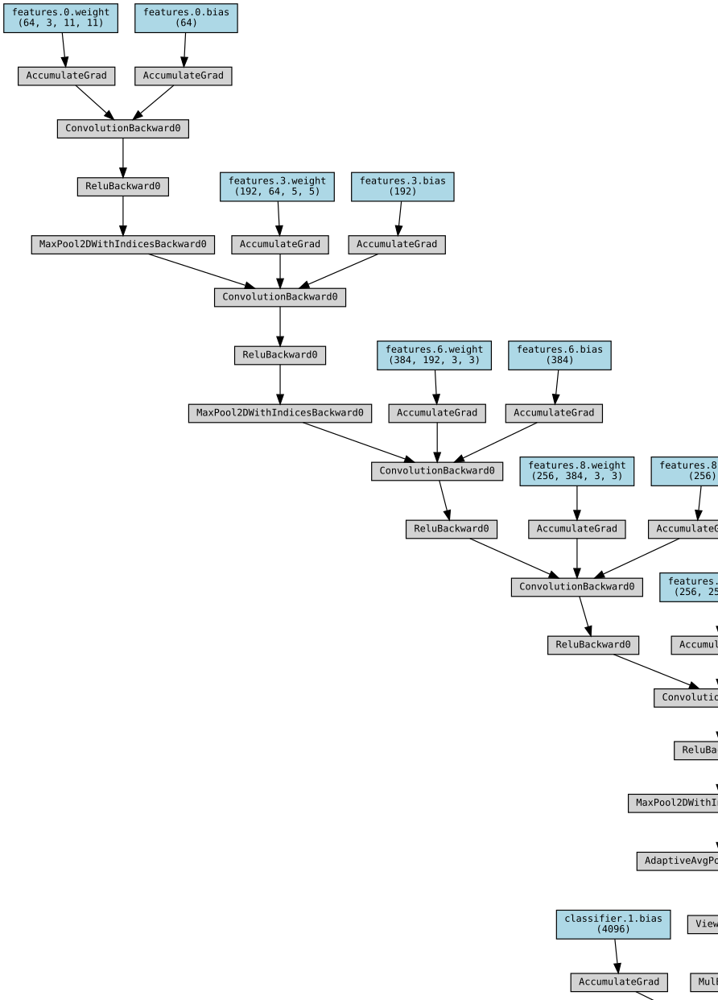

In [ ]:
make_dot(model(input_batch), params=dict(list(model.named_parameters()) + [('x', x)]))

<img src = 'https://upload.wikimedia.org/wikipedia/commons/thumb/c/cc/Comparison_image_neural_networks.svg/1920px-Comparison_image_neural_networks.svg.png'>

Создадим небольшой набор данных на основании набора данных ImageNet.

In [ ]:
import torch
import random
import numpy as np

# fix random_seed
torch.manual_seed(42)
random.seed(42)
np.random.seed(42)

# compute in cpu or gpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# Full list of labels
#'https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json'
!wget -q https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/imagenet_class_index.json

# https://github.com/ajschumacher/imagen.git
!wget -q https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/imagen.zip
!unzip -q imagen.zip

Загрузили категории:

In [ ]:
import json
import pprint
import numpy as np

pp = pprint.PrettyPrinter(width=41, compact=True)

with open("imagenet_class_index.json") as f:
    imagenet_labels = json.load(f)

classes = np.array(list(imagenet_labels.values()))[:, 1]

pp.pprint(
    dict(list(imagenet_labels.items())[:10])
)  # Use Pretty Print to display long dict

{'0': ['n01440764', 'tench'],
 '1': ['n01443537', 'goldfish'],
 '2': ['n01484850', 'great_white_shark'],
 '3': ['n01491361', 'tiger_shark'],
 '4': ['n01494475', 'hammerhead'],
 '5': ['n01496331', 'electric_ray'],
 '6': ['n01498041', 'stingray'],
 '7': ['n01514668', 'cock'],
 '8': ['n01514859', 'hen'],
 '9': ['n01518878', 'ostrich']}


In [ ]:
from glob import glob
from PIL import Image
from torch.utils.data import Dataset


class MicroImageNet(Dataset):
    def __init__(self):
        super().__init__()
        # Load labels
        self.num2id = {}
        with open("imagenet_class_index.json") as f:
            imagenet_labels = json.load(f)
        w_net = {}
        # Because not all world net image codes from imagen exists in imagenet_labels
        # we need to filter this image
        for key in imagenet_labels.keys():
            wn_id = imagenet_labels[key][0]
            w_net[wn_id] = {"num": int(key), "name": imagenet_labels[key][1]}
        self.labels = []
        self.paths = []

        # Load data
        images = glob("imagen/*.jpg")
        images.sort()
        for i, path in enumerate(images):
            name = path.split("_")[2]  # Class name
            id = path.split("_")[0][7:]  # WorldNet based ID
            if w_net.get(id, None):
                self.labels.append([w_net[id]["num"], w_net[id]["name"], id])
                self.paths.append(path)

    def __getitem__(self, idx):
        im = Image.open(self.paths[idx])
        class_num = self.labels[idx][0]
        return im, class_num

    def __len__(self):
        return len(self.paths)


microImgNet = MicroImageNet()

Посмотрим на картинки (задание: добавить предсказанные метки, чтобы они отображались рядом с оригинальными):

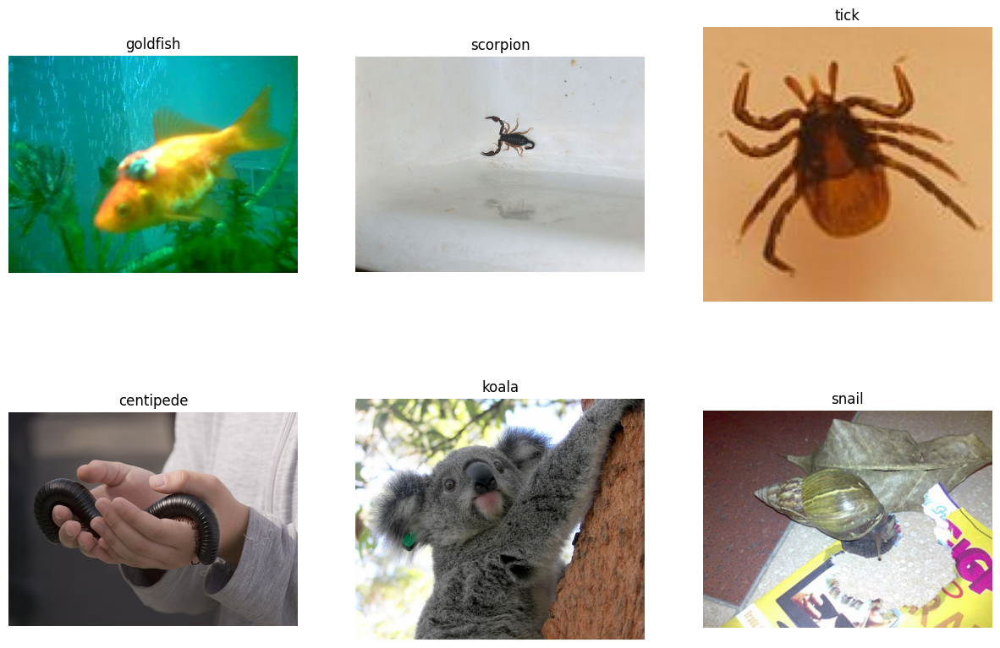

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (15, 10)


def show(img, label_1, num, label_2=""):
    ax = plt.subplot(2, 3, num + 1)
    plt.imshow(img)
    plt.title(label_1)
    ax.set_xlabel(label_2)
    plt.axis("off")


for i in range(6):
    img, label = microImgNet[i * 6]
    name = microImgNet.labels[i * 6][1]
    show(img, name, i)

Сравним PyTorch реализацию с оригинальной. В чем отличия?

In [ ]:
from torchvision import models

alexnet = models.alexnet(weights="AlexNet_Weights.DEFAULT")

In [ ]:
from torchsummary import summary

print("AlexNet architecture")
print(summary(alexnet, (3, 224, 224), device="cpu"))
print(alexnet)

AlexNet architecture
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-

В PyTorch версии:
- отсутствуют нормализации,
- отсутствует разделение на две видеокарты,
- немного изменено количество сверток на некоторых слоях,
- добавлен слой Adaptive Average Pooling.

Количество слоев и размеры сверток те же.

Задание: проверить, как модель распознаёт изображения из созданного нами набора данных.

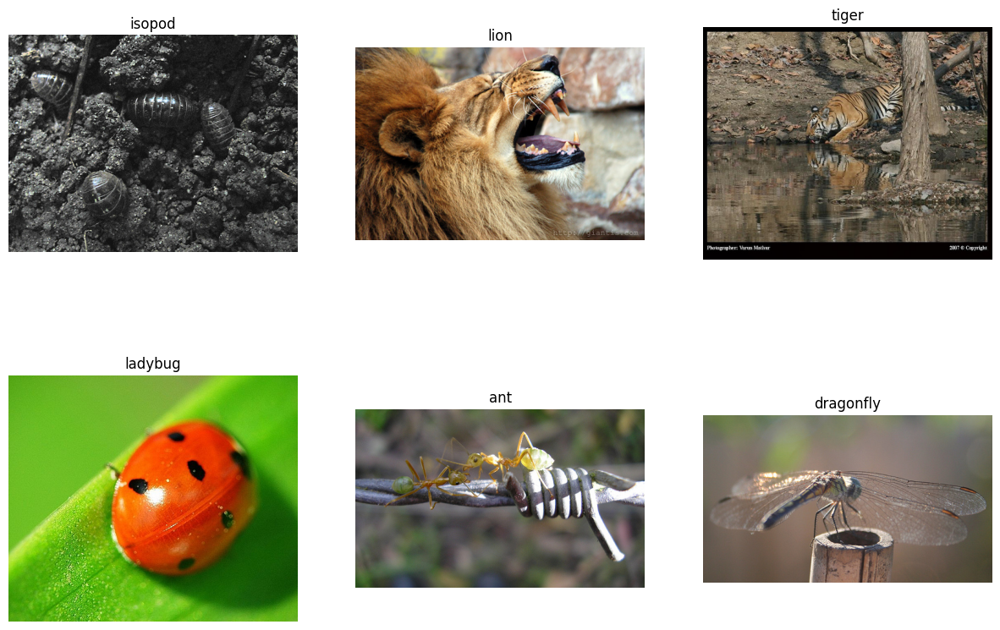

In [ ]:
import torch
import torchvision.transforms.functional as F


def img2tensor(img):
    t = F.to_tensor(img)
    t = F.normalize(t, (0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    return t


def catId2names(nums):
    titles = []
    for num in nums:
        titles.append(imagenet_labels[str(num.item())][1])
        titles.reverse()
    return ", ".join(titles)


for i in range(6, 12):
    img, label = microImgNet[i * 6]
    tensor = img2tensor(img)
    out = alexnet(tensor.unsqueeze(0))
    labels_num = torch.argsort(out[0])  # Ascending order
    predicted = catId2names(labels_num[:5])
    titles = []
    name = microImgNet.labels[i * 6][1]
    show(img, name, i - 6, predicted)

## 2014

VGG

Оригинальная статья: https://arxiv.org/pdf/1409.1556.pdf

Идея простой и глубокой сверточной сети доведена до максимума:
- наиболее известные 2 версии: VGG-16 и VGG-19 (по числу слоев с обучаемыми весами);
- содержит огромное число параметров (138 млн и 144 млн), дальнейшее увеличение глубины и параметров не дало прироста на ImageNet;
- используются только стандартные свертки размера $3\times 3$ (к примеру, в AlexNet первые две свертки были размеров $11\times 11$ и $5\times 5$);
- входной размер $224\times 224$.

VVG-16:

<img src = 'https://www.researchgate.net/profile/Max-Ferguson/publication/322512435/figure/fig3/AS:697390994567179@1543282378794/Fig-A1-The-standard-VGG-16-network-architecture-as-proposed-in-32-Note-that-only.png'>

VGG-19:

<img src = 'https://www.researchgate.net/profile/Clifford-Yang/publication/325137356/figure/fig2/AS:670371271413777@1536840374533/llustration-of-the-network-architecture-of-VGG-19-model-conv-means-convolution-FC-means.jpg'>

[Краткое описание VGGNet](https://www.robots.ox.ac.uk/~vgg/research/very_deep/)

В 2014-ом году в Оксфорде была разработана модель **VGGNet**.

В архитектуре **VGGNet** появляется идея повторения стандартных блоков и увеличения глубины нейросети повторением таких блоков (**stacking**). На момент создания данной архитектуры идея увеличения глубины нейросети для получения лучших результатов не была очевидна. Стандартный блок **VGGNet** состоит из нескольких слоев свертки (от 2 до 4) и max-pooling слоя.

Существует несколько вариантов **VGGNet** архитектуры. Самые известные: **VGG11**, **VGG16** и **VGG19**. Цифра ставится по количеству слоев с обучаемыми весами: сверточных и полносвязных слоев.

На изображении показаны сети **AlexNet** и две версии **VGG16** и **VGG19** с 16 и 19 обучаемыми слоями соответственно. На соревнованиях победила более глубокая **VGG19**, показавшая процент ошибок при классификации top-5 7.3% (у **AlexNet** 15.4%).

Интересные факты о **VGGNet**:
* данная архитектура получила 2-е место в задаче классификации и 1-е место в задаче локализации (классификация и обводка объекта ограничивающей рамкой) на **ImageNet**;
* авторы **VGGNet** отказались от слоев нормализации;
* архитектуры **VGG16** или **VGG19** продолжают применяться для решения ряда прикладных задач.

Особенности архитектуры **VGGNet**:
* все свёрточные слои имеют фильтры с рецептивным полем размера **3×3**;
* сверточные слои  объединены в блоки, состоящие из некоторого количества свёрток с разным (постепенно увеличивающимся от блока к блоку) количеством фильтров;
* между блоками располагаются слои пулинга.

Появление "стандартных" блоков внутри модели — важное нововведение. Идея базового блока внутри сети будет достаточно широко использоваться дальше.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/L09/out/vggnet_architecture.png"  width="400" rotate="180"></center>
<center><em>Сравнение архитектур сетей AlexNet, VGG16 (использует 16 слоев) и VGG19 (использует 19 слоев)</em></center>


# Style Transfer with Deep Neural Networks


Реализуем метод, описанный в статье [Image Style Transfer Using Convolutional Neural Networks, by Gatys](https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf) на PyTorch с использованием архитектуры VGG-19.

Перенос стиля (style transfer) заключается в том, чтобы отделить сам изображённый предмет и стиль, в котором он выполнен на изображении. На вход подаются два изображения - content image и style image, из них формируется _target_ image, которое должно соответствовать критериям:
* оизображённые объекты и их расположение должны быть такими же, как и на **content image**
* стиль, цвета и текстура должны быть такими же, как на **style image**

<img src = 'https://godatadriven.com/wp-content/images/how-to-style-transfer/style-transfer-example.jpg'>

В коде ниже использована предобученная сеть VGG19, при помощи которой выделяются изображённый предмет или признаки стиля, потом составляются потери для изображения (content_loss) и для стиля (style_loss). Изображение итеративно обновляется, пока не получается желаемый результат.  

### Шаг 0. Загружаем необходимые библиотеки

In [ ]:

%matplotlib inline

from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models

### Шаг 1. Загрузка модели VGG19

VGG19 представлена двумя частями:
* `vgg19.features` - свёрточные слои и слои сжатия (convolutional and pooling layers);
* `vgg19.classifier` - три линейных слоя классификации в конце.


Для поставленной задачи выделения стиля необходима только часть `features`, поэтому достаточно загрузить веса уже обученной модели и "заморозить" их.

In [ ]:
# загрузить часть "features" модели VGG19
vgg = models.vgg19().features

# заморозим все парамерты VGG, поскольку необходимо изменять только target image
for param in vgg.parameters():
    param.requires_grad_(False)

### Шаг 2. Выведем на экран параметры модели, и посмотрим, сколько у модели парметров при помощи метода summary, чтобы проверить, что всё верно загрузилось.

In [ ]:
from torchvision import models
from torchsummary import summary

summary(vgg.to(device), (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

### Шаг 3. Выберем устройство для обучения.

In [ ]:
# move the model to GPU, if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

### Шаг 4. Загрузка изображений

Отдельно определяется функция `load_image` для изображений любого размера, которая также приводит загруженные изображения к одному и тому же размеру.

In [ ]:
def load_image(img_path, max_size=400, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= 400 pixels in the x-y dims.'''
    if "http" in img_path:
        response = requests.get(img_path)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    else:
        image = Image.open(img_path).convert('RGB')

    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    if shape is not None:
        # Crop the image to the specified shape
        size = shape

    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.CenterCrop(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406),
                                             (0.229, 0.224, 0.225))])

    image = in_transform(image)[:3, :, :].unsqueeze(0)

    return image

Теперь применим эту функцию для загрузки изображений и отправление их на выбранное устройство.

In [ ]:
# загрузка изображения с объектом
content = load_image('230222_oppenheimer_HP.jpg').to(device)
# загрузка изображения со стилем и изменение размеров для удобства
style = load_image('patern.jpg', shape=content.shape[-2:]).to(device)

### Шаг 5. Для просмотра изображений переведём их в numpy и выведем на экран.

In [ ]:
def im_convert(tensor):
    """ Display a tensor as an image. """

    image = tensor.to("cpu").clone().detach()
    image = np.array(image).squeeze(0)
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

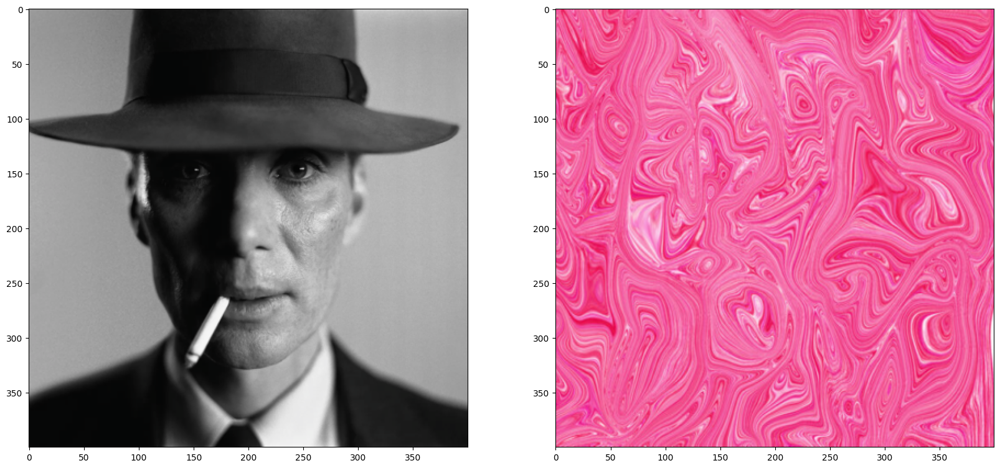

In [ ]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(style))

### Шаг 6. Посмотрим на структуру загруженной модели VGG19, чтобы убедиться, что используются только свёрточные и сжимающие слои.

In [ ]:
vgg

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

### Шаг 7. Content and Style Features

Прочитайте статью и выделите названия слоёв, при помощи которых удалось сопоставить _content representation_ и  _style representation_.

In [ ]:
def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for
        a set of layers. Default layers are for VGGNet matching Gatys et al (2016)
    """

    ## TODO: Complete mapping layer names of PyTorch's VGGNet to names from the paper
    ## Need the layers for the content and style representations of an image
    if layers is None:
        layers = {'0': "conv1_1",
                  '5': "conv2_1",
                  '10': "conv3_1",
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## content representation
                  '28': "conv5_1"}

    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
      x = layer(x)
      if name in layers:
          features[layers[name]] = x

    return features

### Шаг 8. Подсчёт матрицы Грама

Выходгым значением каждого свёрточного слоя будет тензор с размероностями `batch_size`, глубина `d` и пара высота и ширина (`h`, `w`). Матрица Грама может быть посчитана следующим образом:
* извлечь параметры `batch_size, d, h, w = tensor.size`;
* переформатировать изображение к размерности (b * d, h * w);
* матрично умножить полученный тензор на его же транспонированный.

*Напомним, что перемножение матриц можно осуществиить при помоши операции `torch.mm(matrix1, matrix2)`.*

In [ ]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor
    """

    # выделить batch_size, depth, height, width тензора
    b, d, h, w = tensor.size()

    # изменить размерность
    tensor = tensor.reshape(b * d, h * w)

    # применить операцию матричного умножения, чтобы получить матрицу Грама
    gram = tensor @ tensor.t()

    return gram

### Шаг 9.  Применение описанных функций.

In [ ]:
# выделение признаков
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# подсчёт матрицы Грама для каждого слоя из style_features, запишем результат в виде словаря
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}
# создание целевого вектора для результирубщего изображения, для удобства создадим клон этого изображения
target = content.clone().requires_grad_(True).to(device)

### Шаг 10. Функции потерь и веса.

Для каждого из значимых слоёв, определённых выше в словаре `layers`, можно подобрать свои веса в диапазоне $(0;1)$. Если для более ранных слоёв (`conv1_1` и `conv2_1`) сделать больший вес, то можно получить более размытые признаки стиля в целевом изображении (target image). Если увеличить веса более поздних слоёв, то можно получить более точные, мелкие признаки стиля.

В статье определяют параметры alpha (`content_weight`) и beta (`style_weight`). Эти коэффициенты отвечают за то, насколько будет стилизовано выходное изображение. Авторы рекомендуют задать  content_weight = 1 и придать большое значение style_weight для получение наилучшего результата.

In [ ]:
# weights for each style layer
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` our content representation
style_weights = {"conv1_1": 1.,
                 "conv2_1": 0.75,
                 "conv3_1": 0.2,
                 "conv4_1": 0.2,
                 "conv5_1": 0.2}

content_weight = 1  # alpha
style_weight = 1e6  # beta

### Шаг 11. Подсчёт весов и обновление целевого изображения.

Авторы рекомендуют для получения хорошего результата сделать минимум 2000 итераций для обновления изображения. На каждой итерации считаются потери content и style losses и обновляется целевое изображение (target image).

#### Content Loss

В качестве content loss предлагается взять среднее квадратичное отклонение между target и content features на слое `conv4_2`:
```
content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
```

#### Style Loss

Style loss предлагается посчитать по этой же формуле, отличие заключается только в том, что необходимо пройти по всем слоям, определённым в словаре `style_weights`.
> Производится подсчёт матрицы Грама для целевого изображения `target_gram` и изображения со стилем `style_gram` на каждом из слоёв и считается итоговый `layer_style_loss`.
> Результаты нормализуются, исходя из размерности слоёв.

#### Total Loss

Итоговые потери формируются как взвешенная сумма style и content losses, умноженных на выбранные параметры alpha (content_weight) и beta (style_weight).

Сначала потери будут довольно большими, но будут уменьшаться.

Total loss:  2098791.0


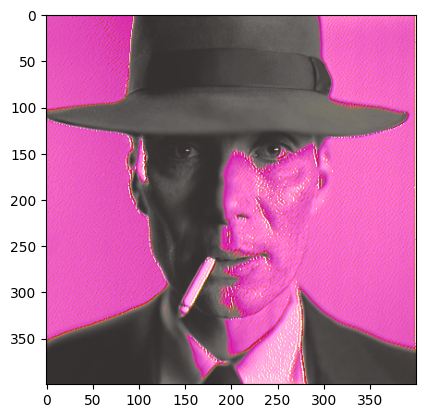

Total loss:  102425.796875


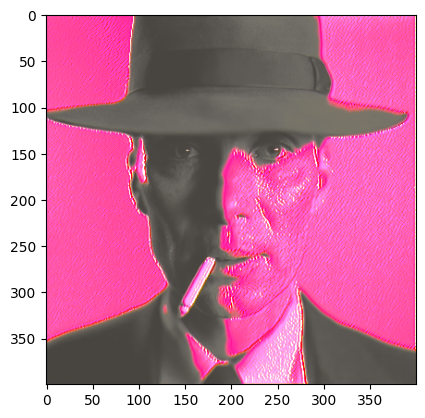

Total loss:  23560.48046875


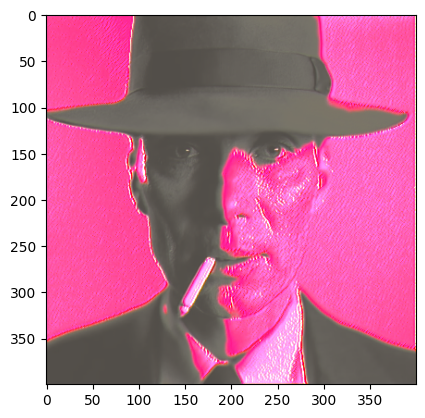

Total loss:  10444.701171875


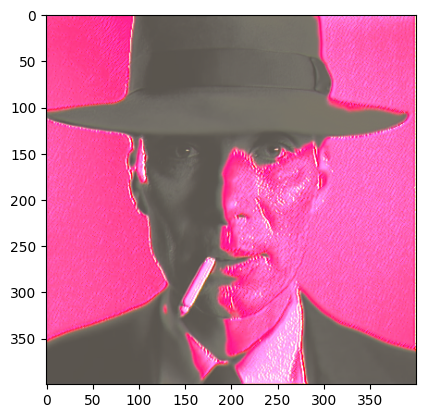

Total loss:  5486.11376953125


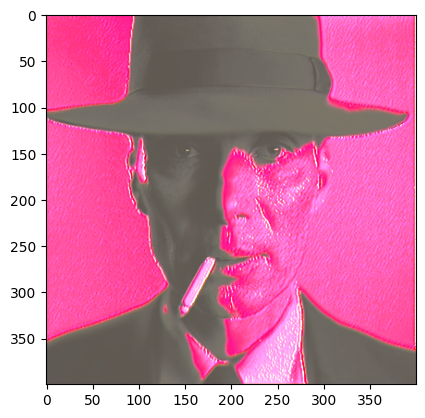

Total loss:  3201.111572265625


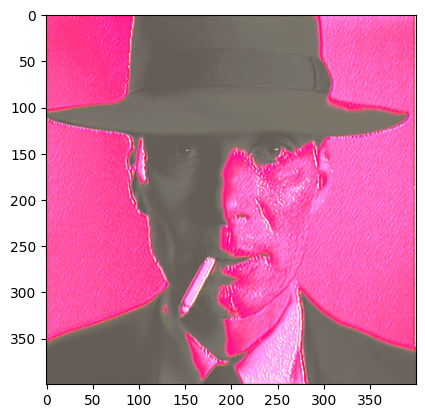

Total loss:  2022.6123046875


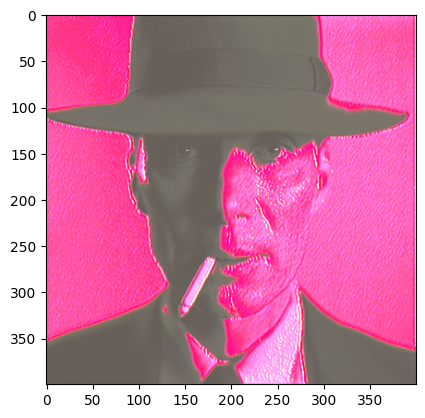

Total loss:  1355.8848876953125


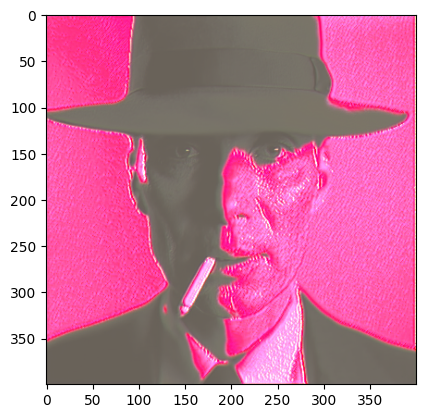

Total loss:  949.1840209960938


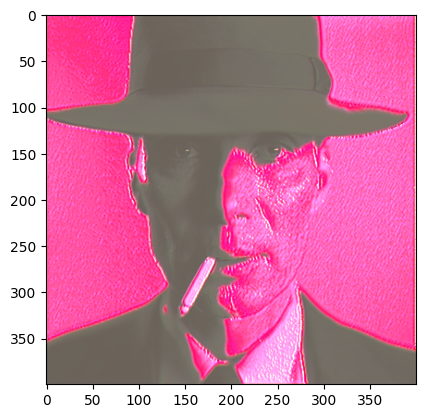

Total loss:  686.0431518554688


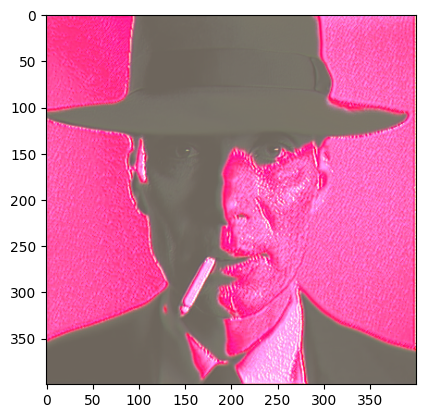

Total loss:  507.7049255371094


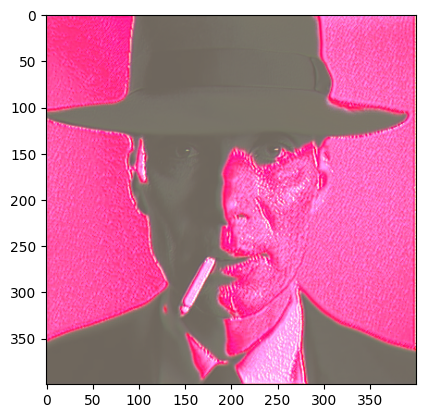

Total loss:  382.2738037109375


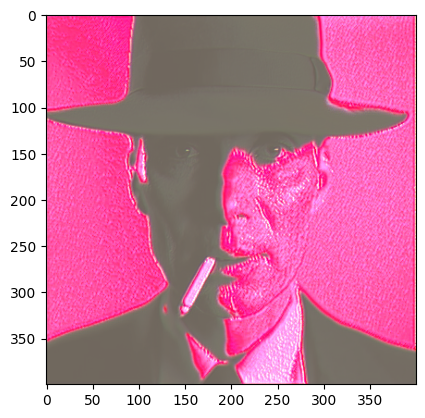

In [ ]:
# for displaying the target image, intermittently
show_every = 400

# iteration hyperparameters
optimizer = optim.Adam([target], lr=0.003)
steps = 5000 # decide how many iterations to update your image (5000)

for ii in range(1, steps+1):

    # get the features from your target image
    target_features = get_features(target, vgg)

    # content loss
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)

    #  style loss изначально задаётся 0
    style_loss = 0
    # а потом на каждом шаге к нему прибавляются потери матрицы Грама
    for layer in style_weights:
        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        # get the "style" style representation
        style_gram = style_grams[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)

    # calculate the *total* loss
    total_loss = content_weight * content_loss + style_weight * style_loss

    # update your target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

### Шаг 12. Вывод на экран целевого изображения  (target Image)

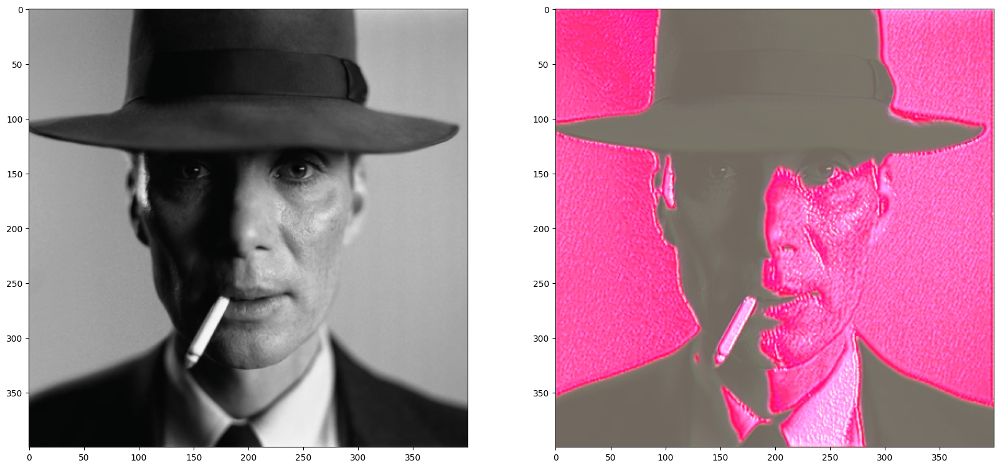

In [ ]:
# display content and final, target image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(target))

## 2014 год

Christian Szegedy и команда создают сеть Inception. Оригинальная статья: [Going Deeper with Convolutions (Szegedy et al., 2014)](https://arxiv.org/abs/1409.4842)

В отличие от предыдущих нейросетей, **GoolLeNet** разработана в коммерческой компании с целью практического применения, поэтому основной упор был сделан на эффективность.

Мотивация - хочется сделать глубокую НС, но простое добавление слоев, как в VGG не дает прироста в качестве.
Особенности Inception:
- Разреженная архитектура:
    - проблема: линейное наращивание сверточных слоев достаточно быстро себя исчерпывает (вспомним VGG)
    - решение: использование нелинейной разреженной архитектуры
- Конкатенация фильтров:
    - проблема: при линейной структуре признаки с рецептивного поля (область, которая участвует в вычислении данного нейрона) одного размера (ограниченного размером свертки)
    - решение: конкатенировать выходы сверток разного размера на слоях одной глубины
- Уменьшение сложности
    - проблема: при большом количестве карт много вычислений свертки
    - решение: с помощью свертки $1\times 1$ предварительно уменьшить количество карт. И вместо полносвязных слоёв на последнем уровне сделать global average pool и подцепить его к output layer напрямую.
    
Составной блок **GoogLeNet** называется **Inception module**. Архитектура **GoogLeNet** состоит из множества таких блоков, следующих друг за другом.

Идея **Inception module** состоит в том, чтобы производить параллельные вычисления сверток с различным размером перцептивного поля и Max Pooling, конкатенируя (объединяя, а не складывая) полученные результаты. Это позволяет выделять признаки разного размера и сложности.
    
<img src = 'https://production-media.paperswithcode.com/methods/Screen_Shot_2020-06-22_at_3.22.39_PM.png'>

Как мы уже показали, при использовании наивной реализации **Inception module** количество фильтров возрастает от слоя к слою.

Чтобы этого избежать, введены так называемые **«бутылочные горлышки»** — слои с фильтром **1×1**, уменьшающие глубину изображения. Благодаря им удалось достичь того, чтобы количество каналов на входе и на выходе либо не менялось, либо менялось только в моменты, когда это необходимо.

Интересно, что слой свертки **1x1** ставится после слоя **Max Pooling**. Это позволяет более эффективно преобразовывать признаки.


<center><img src ="https://edunet.kea.su/repo/EduNet-content/L09/out/1x1_convolution.png"  width="550"></center>
<center><em>Уменьшение глубины изображения с помощью 32 фильтров 1×1.</em></center>


Свёртку **1х1** можно сравнить с линейным слоем полносвязной нейронной сети. Мы берем вектор из карты признаков (столбик 1x1x64 на картинке) и домножаем на матрицу весов (одну для всех векторов, в данном случае матрица будет 64x32, т.к. она составлена из 32 фильтров с размерами 1x1x64), чтобы получить вектор на выходе (столбик 1x1x32 на картинке).

Это одновременно формирует более сложные признаки, собирая информацию с различных сверток и **Max Pooling**, и позволяет сократить их количество.

Отдельного внимания заслуживает завершающая часть сети. В **AlexNet** и **VGGNet** мы привыкли видеть в конце сети вытягивание карты признаков в вектор и два полносвязных слоя. В **GoogLeNet** один из полносвязных слоев заменен на
**Global Average Pooling**.

[Network In Network, Lin et al., 2013](https://arxiv.org/abs/1312.4400)



Этот слой просто усредняет все значения в канале. На выходе получаем вектор признаков количество элементов в котором равно количеству каналов.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/L09/out/global_average_pooling.png"  width="570"></center>
<center><em>Global Average Pooling</em></center>

Плюсы **GAP**:

* независимость от размера входа;
* регуляризация (препятствует переобучению);
* уменьшение числа параметров;


В PyTorch можно реализовать GAP при помощи класса [nn.AdaptiveAvgPool2d](https://pytorch.org/docs/stable/generated/torch.nn.AdaptiveAvgPool2d.html). При создании экземпляра класса указываем, какую пространственную размерность мы хотим получить на выходе. При `output_size = 1`получим результат как на иллюстрации.

Задание. Проверить, как работает сеть GoogleNet на созданнои нами наборе данных microImgNet

In [ ]:
from torchvision import models
from torch import nn

googleNet = models.googlenet(weights="GoogLeNet_Weights.DEFAULT")

Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 75.6MB/s]


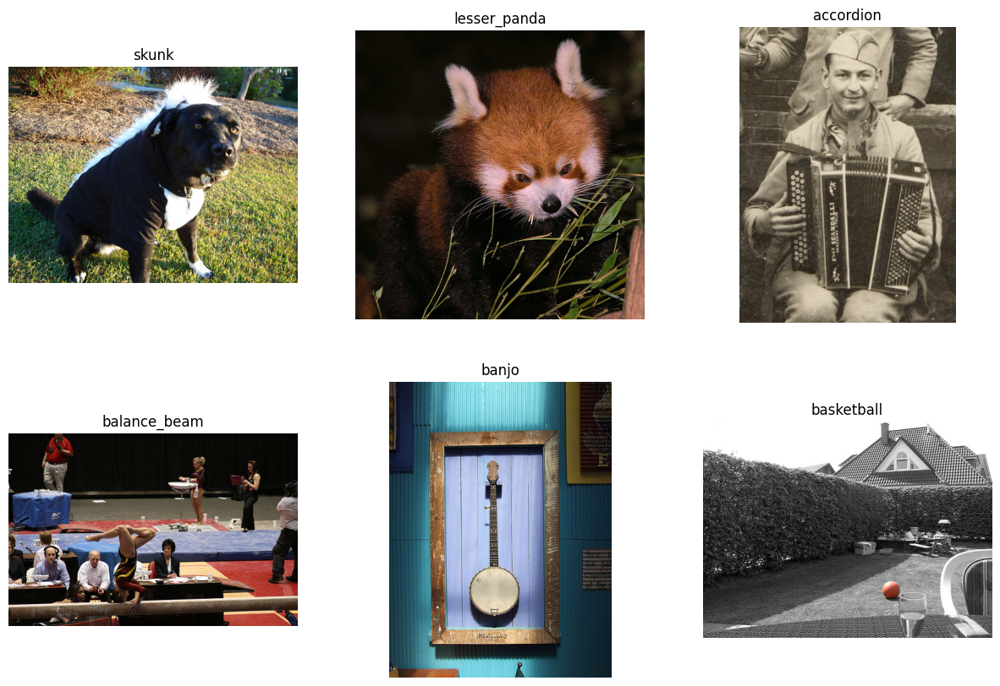

In [ ]:
for i in range(10, 16):
    img, label = microImgNet[i * 10]
    tensor = img2tensor(img)
    out = googleNet(tensor.unsqueeze(0))
    labels_num = torch.argsort(out[0], descending=True)
    predicted = catId2names(labels_num[:5])
    name = microImgNet.labels[i * 10][1]
    show(img, name, i - 10, predicted)

В 2015 году вышла статья [Batch Normalization: Accelerating Deep Network Training by Reducing Internal Covariate Shift](https://arxiv.org/abs/1502.03167). Благодаря добавлению слоя BatchNorm стало технически возможно обучать сети состоящие из десятков слоев.

Но точность с увеличением глубины не росла:

<center><img src ="https://edunet.kea.su/repo/EduNet-content/L09/out/resnet_20_and_56_layers.png"  width="550"></center>
<center><em>График ошибки на обучающей и тестовой выборках двух модификаций
VGGNet с 20 и 56 слоями соответственно в ходе процесса обучения </em></center>

<center><em>Source: <a href="https://arxiv.org/pdf/1512.03385.pdf">Deep Residual Learning for Image Recognition (He et al., 2015)</a></em></center>

На слайде выше приведено сравнение графиков обучения 56-слойной и 20-слойной сетей Microsoft, построенных на принципах VGGNet. Как видно из графиков, у 56-слойной сети и на тренировочном, и на тестовом датасете ошибка больше, чем у 20-слойной. Казалось бы, сеть, состоящая из большего количества слоёв, должна работать как минимум не хуже, чем сеть меньшего размера. К сожалению, проблема **затухания градиента** в этом случае не позволяет эффективно обучить более глубокую сеть.

В 2015 году соревнования выиграла сеть **ResNet**, архитектура которой предлагала новый подход к решению проблемы обучения глубоких сетей. Она состояла из 152 слоёв и снизила процент ошибок до 3,57%. Это сделало её почти в два раза эффективнее **GoogLeNet**.

При обучении нейронной сети методом обратного распространения ошибки модуль градиента постепенно уменьшается, проходя через каждый из слоёв сети. В глубоких сетях "длина" такого пути оказывается достаточной для того, чтобы модуль градиента стал мал и процесс обучения фактически остановился. В архитектуре **ResNet** такая проблема решается отказом от простого последовательного соединения слоёв (stacking) в пользу создания дополнительных связей в вычислительном графе нейронной сети, через которые градиент смог бы распространяться, минуя свёрточные слои и таким образом не затухая.

Сеть архитектуры **ResNet** состоит из набора так называемых **Residual Block**-ов. В данном блоке тензор входных признаков пропускается через пару последовательно соединённых свёрточных слоёв, после чего полученный результат складывается поканально с этим же неизменённым входным тензором. Свёрточные слои в таком блоке аппроксимируют не саму функциональную зависимость между входным и выходным тензором, а разность (анг. residual) между такой искомой зависимостью и тождественным преобразованием.

# Skip connection (ResNet 2015)

<center><img src ="https://edunet.kea.su/repo/EduNet-content/L09/out/resudial_connection.png"  width="700"></center>
<center><em>Сравнение Residual Block с "обычными" слоями</em></center>


Идея **Residual Block** состоит в уточнении набора признаков на каждом блоке. Вместо того, чтобы перезаписывать признаки, мы добавляем к выходу предыдущего блока уточнение, сформированное на этом блоке.

Бонусы **Residual Block**:
- канал суммирования позволяет градиенту легко распространяться без затухания;
- не теряется информация о важных признаках, выделенных на предыдущем слое.

## Архитектура ResNet

<center><img src ="https://edunet.kea.su/repo/EduNet-content/L09/out/resnet_architecture.png"  width="730"></center>
<center><em>Архитектура ResNet. Используется стаккинг residual blocks, каждый residual block состоит из двух 3x3 conv слоев, переодически количество фильтров в свертках удваивается, а размер выходных слоев уменьшается в 2 раза (за счет stride = 2). Добавился дополнительный conv слой в начале сети. Отсутствуют FC слои (кроме последнего, который предсказывает класс).</em></center>


Из таких блоков можно построить очень глубокую сеть (были эксперименты из 1000 слоев). Для решения конкретной задачи — победы на **ImageNet** — хватило 150 слоев (добавление большего количества блоков уже не давало прироста точности).

В **ResNet** используются многие идеи, которые присутствовали в предыдущих моделях:
- вначале изображение резко уменьшается,
- дальше используются блоки 3х3, как в **VGGNet**,
- применяется **Average Pooling** вместо полносвязного слоя.

Блоки состоят из конструкций, изображенных выше:
- две свёртки 3Х3,
- batch normalization после каждой свертки,
- функции активации ReLU,
- прибавление результата предыдущего слоя.

# Поиск хорошей архитектуры

<center><img src ="https://edunet.kea.su/repo/EduNet-content/L09/out/deep_models_modern.png"  width="900"></center>
<center>


Мы рассмотрели достаточно много блоков, из которых можно построить модель. Но как оптимально их использовать? Надо ли делать сеть максимально глубокой или надо стремиться выделить как можно больше признаков?

## Neural Architecture Search

[Neural Architecture Search with Reinforcement Learning (Zoph et al., 2016)](https://arxiv.org/abs/1611.01578)

<center><img src ="https://edunet.kea.su/repo/EduNet-content/L09/out/neural_architecture_search.png"  width="600"></center>
<center><em>Схема автоматического поиска архитектуры нейронных сетей </em></center>

Проектировать архитектуры нейронных сетей сложно — можно автоматизировать поиск архитектуры и пойти пить чай!

Для создания **MobileNetV3** использовалась система автоматического поиска архитектуры. Вот некоторые ее особенности:
- Рекуррентная нейронная сеть (контроллер) выводит архитектуры сетей.
- У нас нет размеченных данных. Для того, чтобы понять, насколько хороша выведенная контроллером архитектура, создается и обучается  дочерняя сеть с этой архитектурой. При этом максимизируется итоговая точность обученной дочерней сети (это — обучение без учителя или обучение с подкреплением, подробнее об обучении с подкреплением мы поговорим в других лекциях).
- Т.к. дочерняя сеть долго обучается, есть смысл обучать несколько дочерних сетей параллельно.
- После обучения партии дочерних сетей делаем градиентный шаг на сети контроллера (используя градиент политики).
- Со временем контроллер учится выдавать хорошие архитектуры!
- ОЧЕНЬ ДОРОГО!!! Каждый шаг градиента на контроллере требует обучения дочерних моделей!
- Оригинальная статья обучалась на 800 GPU в течение 28 дней!
- Последующие работы были сосредоточены на более эффективном поиске архитектур.

## Обзор сети EfficientNet (2019 г.)

[EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks (Tan et al., 2019)](https://arxiv.org/abs/1905.11946)

Идея **EfficientNet** состоит в том, чтобы получить возможность подбирать оптимальную глубину (число слоев), ширину (число каналов в слое) и разрешение (длину и ширину карты признаков) для конкретной задачи. Например, если мы берём входное изображение больше, чем обычно (например, 1024x1024 вместо привычных 256x256), то сети потребуется больше слоёв для увеличения рецептивного поля и больше каналов для захвата более тонких деталей на большом изображении.





Масштабирование происходит с помощью составного коэффициента (**compound coefficient**).

Например, если у нас есть возможность использовать в $2^N$ больше вычислительных ресурсов, то мы можем просто увеличить глубину сети на $\alpha^N$, ширину — на $\beta^N$, и размер изображения — на $\gamma^N$, где $\alpha$, $\beta$ и $\gamma$ — постоянные коэффициенты, определяемые grid search на исходной немасштабированной модели.

<img src ="https://edunet.kea.su/repo/EduNet-content/L09/out/efficientnet.png"  width="900">

Базовая сеть **EfficientNet** основана на инвертированных узких остаточных блоках **MobileNet** в дополнение к блокам сжатия и возбуждения (**squeeze-and-excitation blocks**).

In [ ]:
from torchvision.models import efficientnet_b0
from torchsummary import summary

en_b0 = efficientnet_b0()
print(summary(en_b0, (3, 224, 224), device="cpu"))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
              SiLU-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]             288
       BatchNorm2d-5         [-1, 32, 112, 112]              64
              SiLU-6         [-1, 32, 112, 112]               0
 AdaptiveAvgPool2d-7             [-1, 32, 1, 1]               0
            Conv2d-8              [-1, 8, 1, 1]             264
              SiLU-9              [-1, 8, 1, 1]               0
           Conv2d-10             [-1, 32, 1, 1]             288
          Sigmoid-11             [-1, 32, 1, 1]               0
SqueezeExcitation-12         [-1, 32, 112, 112]               0
           Conv2d-13         [-1, 16, 112, 112]             512
      BatchNorm2d-14         [-1, 16, 1

Если вы не знаете, какую модель выбрать, используйте EfficientNet.

Задание. Загрузить EfficientNet и получить 5 лучших предсказаний для указанной картинки.

In [ ]:
model_name = 'efficientnet-b0'
image_size = 244

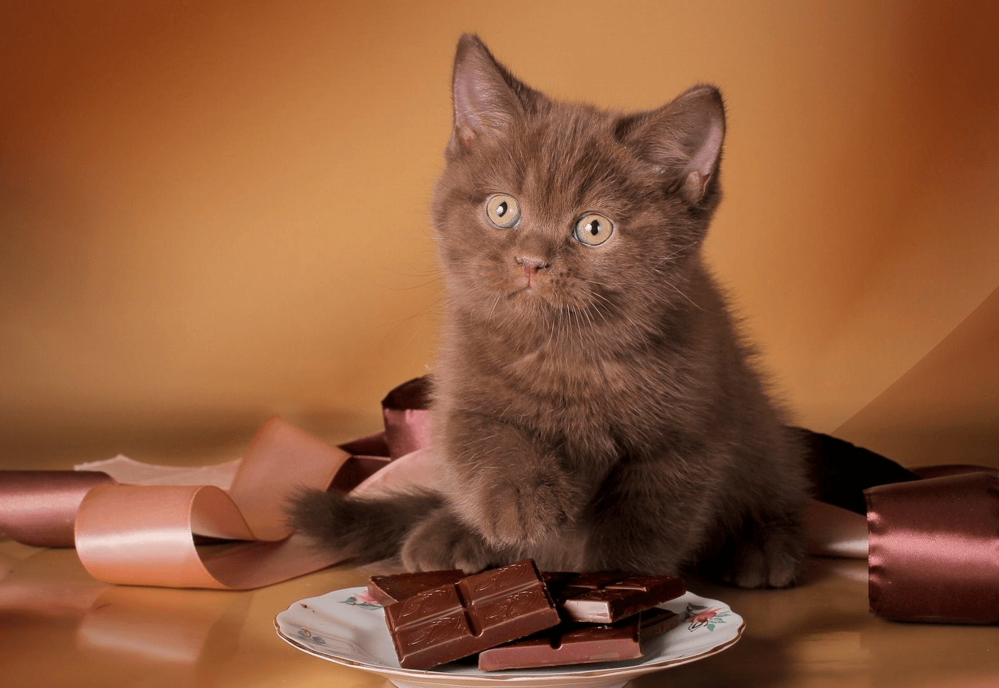

In [ ]:
# Open image
img = Image.open('ChocoCat.png').convert("RGB")
img

In [ ]:
# Preprocess image
tfms = transforms.Compose([transforms.Resize(image_size), transforms.CenterCrop(image_size),
                           transforms.ToTensor(),
                           transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),])
img = tfms(img)

In [ ]:
# Load class names
labels_map = json.load(open('imagenet_class_index.json'))

labels_map = [labels_map[str(i)] for i in range(1000)]

In [ ]:
model = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_efficientnet_b0', pretrained=True)
model.eval()

with torch.no_grad():
    logits = model(img.unsqueeze(0))
preds = torch.topk(logits, k=5).indices.squeeze(0).tolist()

print('-----')
for idx in preds:
    label = labels_map[idx]
    prob = torch.softmax(logits, dim=1)[0, idx].item()
    print('{:<75} ({:.2f}%)'.format(label[1], prob*100))

Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


-----
Persian_cat                                                                 (60.40%)
mouse                                                                       (10.50%)
computer_keyboard                                                           (5.02%)
remote_control                                                              (1.34%)
tabby                                                                       (1.13%)


<img src = 'https://blog.kakaocdn.net/dn/ovjO7/btqTJmXzJ1f/F7AWk6orgbUyrDPYX9yJwk/img.png'>

Материалы:
    презентация https://se.moevm.info/lib/exe/fetch.php/courses:artificial_neural_networks:lecture_3.pdf